# UNESCO World Heritage Sites 2019

## Content
This dataset contains spatial data of 1121 World Heritage Sites that were listed into the World Heritage List by UNESCO.

The dataset is prepared by Ujwal Kandi

Here is the dataset link : https://www.kaggle.com/ujwalkandi/unesco-world-heritage-sites

1 - Import libraries I used for visualization

In [87]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from plotly.offline import init_notebook_mode, iplot
from collections import Counter
from operator import itemgetter
from IPython.display import display, HTML
from plotly.subplots import make_subplots
from wordcloud import WordCloud, STOPWORDS,ImageColorGenerator 
from PIL import Image, ImageOps
import plotly.express as px
import plotly.io as pio
import datetime
%matplotlib inline

sns.set(style="darkgrid")

import warnings
warnings.filterwarnings("ignore", category=UserWarning)

In [88]:
import os
os.environ['PROJ_LIB'] = r'C:\Users\Noyan\Anaconda3\Library\share'

from mpl_toolkits.basemap import Basemap

In [89]:
import folium

2 - Define dataframe after loading all values from cv file and assigning them to it

In [90]:
file_location_url = "files/whc-sites-2019.csv";

unesco_world_heritage_df = pd.read_csv(file_location_url, error_bad_lines=False,encoding = "utf-8")

3 - Deterime how many rows and columns are defined in dataframe

In [91]:
row_count = unesco_world_heritage_df.shape[0]
column_count = unesco_world_heritage_df.shape[1]

print("Row : {} , Column : {}".format(row_count,column_count))

Row : 1121 , Column : 22


4 - Show first 5 values of dataframe

In [92]:
unesco_world_heritage_df.head()

,category,states_name_en,region_en,unique_number,id_no,rev_bis,name_en,short_description_en,justification_en,date_inscribed,...,date_end,danger_list,longitude,latitude,area_hectares,criteria_txt,category_short,iso_code,udnp_code,transboundary
0,Cultural,Afghanistan,Asia and the Pacific,230,208,Rev,Cultural Landscape and Archaeological Remains ...,The cultural landscape and archaeological rem...,<em>Criterion (i):</em> The Buddha statues an...,2003,...,NaN,Y 2003,67.825250,34.846940,158.9265,(i)(ii)(iii)(iv)(vi),C,af,afg,0
1,Cultural,Afghanistan,Asia and the Pacific,234,211,Rev,Minaret and Archaeological Remains of Jam,"The 65m-tall Minaret of Jam is a graceful, so...",<em>Criterion (ii):</em> The innovative archi...,2002,...,NaN,Y 2002,64.515889,34.396417,70.0000,(ii)(iii)(iv),C,af,afg,0
2,Cultural,Albania,Europe and North America,1590,569,Bis,Historic Centres of Berat and Gjirokastra,Berat and Gjirokastra are inscribed as rare e...,NaN,2005,...,NaN,NaN,20.133333,40.069444,58.9000,(iii)(iv),C,al,alb,0
3,Cultural,Albania,Europe and North America,1563,570,ter,Butrint,"Inhabited since prehistoric times, Butrint ha...",NaN,1992,...,2005.0,P 1997-2005,20.026111,39.751111,NaN,(iii),C,al,alb,0
4,Cultural,Algeria,Arab States,111,102,NaN,Al Qal'a of Beni Hammad,In a mountainous site of extraordinary beauty...,NaN,1980,...,NaN,NaN,4.786840,35.818440,150.0000,(iii),C,dz,dza,0


5 - Show last 5 values of dataframe

In [93]:
unesco_world_heritage_df.tail()

,category,states_name_en,region_en,unique_number,id_no,rev_bis,name_en,short_description_en,justification_en,date_inscribed,...,date_end,danger_list,longitude,latitude,area_hectares,criteria_txt,category_short,iso_code,udnp_code,transboundary
1116,Cultural,"Portugal,Spain",Europe and North America,1642,866,Bis,Prehistoric Rock Art Sites in the Côa Valley a...,The two Prehistoric Rock Art Sites in the Côa...,NaN,1998,...,NaN,NaN,-6.661111,40.697500,NaN,(i)(iii),C,"pt,es","prt,esp",1
1117,Natural,"Russian Federation,Mongolia","Europe and North America,Asia and the Pacific",909,769,Rev,Uvs Nuur Basin,"The Uvs Nuur Basin (1,068,853 ha), is the nor...",<em>Criterion (ix)</em>: The closed salt lake...,2003,...,NaN,NaN,92.719722,50.275000,898063.5,(ix)(x),N,"ru,mn","rus,mng",1
1118,Natural,"Russian Federation,Mongolia","Europe and North America,Asia and the Pacific",2150,1448,NaN,Landscapes of Dauria,Shared between Mongolia and the Russian Feder...,NaN,2017,...,NaN,NaN,115.425444,49.930222,912624.0,(ix)(x),N,"ru,mn","rus,mng",1
1119,Cultural,"Slovenia,Spain",Europe and North America,1841,1313,Rev,Heritage of Mercury. Almadén and Idrija,The property includes the mining sites of Alm...,NaN,2012,...,NaN,NaN,-4.838889,38.775278,104.1,(ii)(iv),C,"si,es","svn,esp",1
1120,Natural,"Zambia,Zimbabwe",Africa,593,509,NaN,Mosi-oa-Tunya / Victoria Falls,These are among the most spectacular waterfal...,NaN,1989,...,NaN,NaN,25.855390,-17.924530,6860.0,(vii)(viii),N,"zm,zw","zmb,zwe",1


6 - Show each column information of dataframe

In [94]:
unesco_world_heritage_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1121 entries, 0 to 1120
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   category              1121 non-null   object 
 1   states_name_en        1121 non-null   object 
 2   region_en             1121 non-null   object 
 3   unique_number         1121 non-null   int64  
 4   id_no                 1121 non-null   int64  
 5   rev_bis               267 non-null    object 
 6   name_en               1121 non-null   object 
 7   short_description_en  1121 non-null   object 
 8   justification_en      334 non-null    object 
 9   date_inscribed        1121 non-null   int64  
 10  secondary_dates       87 non-null     object 
 11  danger                1121 non-null   int64  
 12  date_end              39 non-null     float64
 13  danger_list           88 non-null     object 
 14  longitude             1121 non-null   float64
 15  latitude             

7 - Show how many variables there are in dataframe

In [95]:
unesco_world_heritage_df.count()

category                1121
states_name_en          1121
region_en               1121
unique_number           1121
id_no                   1121
rev_bis                  267
name_en                 1121
short_description_en    1121
justification_en         334
date_inscribed          1121
secondary_dates           87
danger                  1121
date_end                  39
danger_list               88
longitude               1121
latitude                1121
area_hectares           1101
criteria_txt            1121
category_short          1121
iso_code                1120
udnp_code               1120
transboundary           1121
dtype: int64

8 - Show descriptive statistics of dataframe

In [96]:
unesco_world_heritage_df.describe()

,unique_number,id_no,date_inscribed,danger,date_end,longitude,latitude,area_hectares,transboundary
count,1121.000000,1121.000000,1121.000000,1121.000000,39.000000,1121.000000,1121.000000,1.101000e+03,1121.00000
mean,1170.794826,803.338983,1997.819804,0.047279,2006.923077,20.387607,28.948467,3.366926e+05,0.03479
std,666.608343,456.463038,11.655302,0.212330,7.808176,63.082727,23.692877,2.920137e+06,0.18333
min,4.000000,1.000000,1978.000000,0.000000,1988.000000,-179.715278,-54.594722,0.000000e+00,0.00000
25%,638.000000,405.000000,1987.000000,0.000000,2003.500000,-3.328986,17.483330,1.140000e+01,0.00000
50%,1123.000000,805.000000,1998.000000,0.000000,2006.000000,16.383333,36.100833,1.870000e+02,0.00000
75%,1765.000000,1196.000000,2007.000000,0.000000,2012.500000,50.512778,45.767220,1.355155e+04,0.00000
max,2333.000000,1610.000000,2019.000000,1.000000,2019.000000,178.834533,71.188889,6.729690e+07,1.00000


9 - Determine if null values of each column are in a dataframe

In [97]:
unesco_world_heritage_df.isnull().sum()

category                   0
states_name_en             0
region_en                  0
unique_number              0
id_no                      0
rev_bis                  854
name_en                    0
short_description_en       0
justification_en         787
date_inscribed             0
secondary_dates         1034
danger                     0
date_end                1082
danger_list             1033
longitude                  0
latitude                   0
area_hectares             20
criteria_txt               0
category_short             0
iso_code                   1
udnp_code                  1
transboundary              0
dtype: int64

10 - Define TreeMap to show World Heritage Sites by Area

In [98]:
unesco_world_heritage_by_area_df = unesco_world_heritage_df[unesco_world_heritage_df["area_hectares"].notnull()]

fig = px.treemap(unesco_world_heritage_by_area_df, 
                 path=["states_name_en"], values="area_hectares", height=700,
                 title="UNESCO World Heritage Sites by Area",
                 color_discrete_sequence = px.colors.qualitative.Prism)
fig.data[0].textinfo = 'label+text+value'
pio.write_image(fig, "images/image1.png")
fig.show()

11 - Draw a Figure to show Top 20 World Heritage Sites by Country and Category

In [99]:
unesco_world_heritage_df["category"].unique()

array(['Cultural', 'Mixed', 'Natural'], dtype=object)

In [100]:
unesco_world_heritage_df_country_category = unesco_world_heritage_df.groupby(['states_name_en','category']).size() \
                             .reset_index() \
                             .pivot(columns='category', index='states_name_en', values=0)

In [101]:
unesco_world_heritage_df_country_category

category,Cultural,Mixed,Natural
states_name_en,,,
Afghanistan,2.0,NaN,NaN
Albania,2.0,NaN,NaN
"Albania,Austria,Belgium,Bulgaria,Croatia,Germany,Italy,Romania,Slovakia,Slovenia,Spain,Ukraine",NaN,NaN,1.0
"Albania,North Macedonia",NaN,1.0,NaN
Algeria,6.0,1.0,NaN
...,...,...,...
Venezuela (Bolivarian Republic of),2.0,NaN,1.0
Viet Nam,5.0,1.0,2.0
Yemen,3.0,NaN,1.0


In [102]:
unesco_world_heritage_df_country_category["Cultural"] = unesco_world_heritage_df_country_category["Cultural"].replace(np.nan, 0)
unesco_world_heritage_df_country_category["Mixed"] = unesco_world_heritage_df_country_category["Mixed"].replace(np.nan, 0)
unesco_world_heritage_df_country_category["Natural"] = unesco_world_heritage_df_country_category["Natural"].replace(np.nan, 0)

In [103]:
unesco_world_heritage_df_country_category["Total"] = unesco_world_heritage_df_country_category["Cultural"] + \
                                                     unesco_world_heritage_df_country_category["Mixed"] + \
                                                     unesco_world_heritage_df_country_category["Natural"]

In [104]:
unesco_world_heritage_df_country_category

category,Cultural,Mixed,Natural,Total
states_name_en,,,,
Afghanistan,2.0,0.0,0.0,2.0
Albania,2.0,0.0,0.0,2.0
"Albania,Austria,Belgium,Bulgaria,Croatia,Germany,Italy,Romania,Slovakia,Slovenia,Spain,Ukraine",0.0,0.0,1.0,1.0
"Albania,North Macedonia",0.0,1.0,0.0,1.0
Algeria,6.0,1.0,0.0,7.0
...,...,...,...,...
Venezuela (Bolivarian Republic of),2.0,0.0,1.0,3.0
Viet Nam,5.0,1.0,2.0,8.0
Yemen,3.0,0.0,1.0,4.0


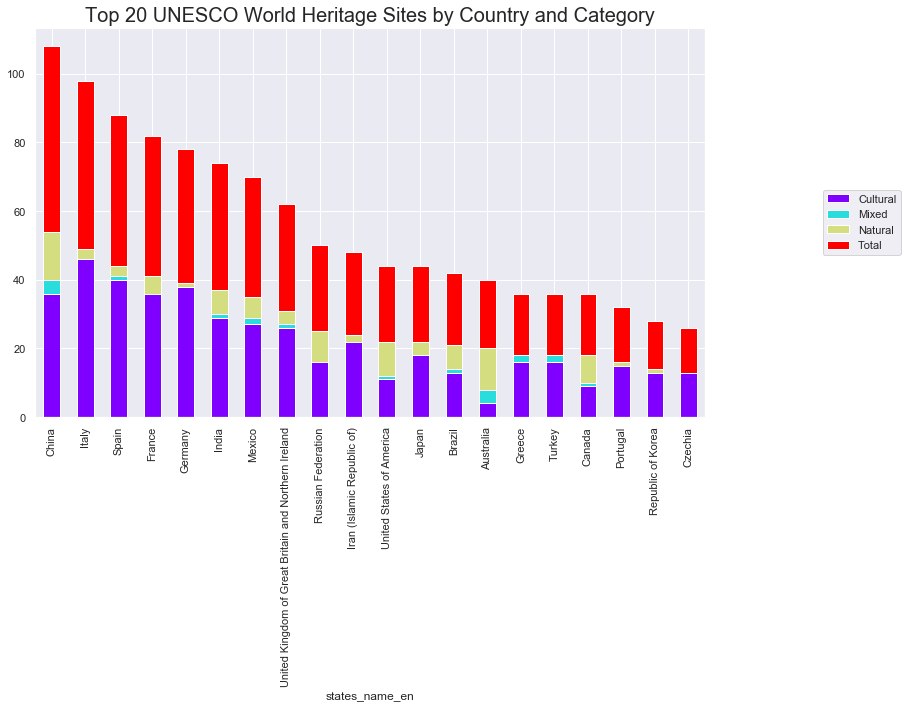

In [105]:
ax = unesco_world_heritage_df_country_category[list(unesco_world_heritage_df_country_category.columns)] \
                                                    .sort_values(by='Total',ascending=False) \
                                                    .head(20) \
                                                    .plot(kind='bar', \
                                                    stacked=True, \
                                                    figsize=(13,10), \
                                                    colormap='rainbow')
plt.title('Top 20 UNESCO World Heritage Sites by Country and Category', fontsize=20) 
leg = ax.legend(loc='center right', bbox_to_anchor=(1.3, 0.5), ncol=1)
plt.tight_layout()
plt.savefig('images/image2.png', bbox_inches = "tight")  
plt.show()

12 - Draw a World Map to show all World Heritage Locations

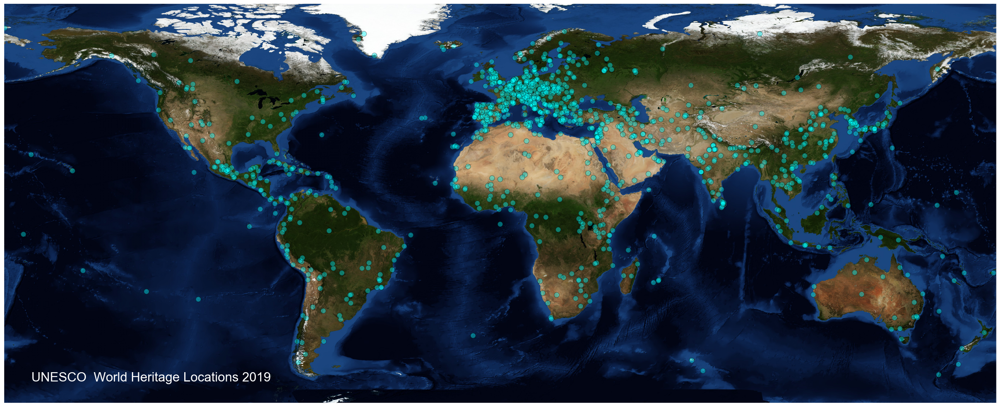

In [106]:
# Set the dimension of the figure
my_dpi=96
plt.figure(figsize=(2600/my_dpi, 1800/my_dpi), dpi=my_dpi)
 
# Make the background map
m=Basemap(llcrnrlon=-180, llcrnrlat=-65,urcrnrlon=180,urcrnrlat=80)
m.bluemarble()
 

# Add a point per position
m.plot(unesco_world_heritage_df['longitude'], 
       unesco_world_heritage_df['latitude'], 
       linestyle='none', 
       marker="o",
       alpha=0.4,
       markeredgewidth=0.9,
       markersize=10,
       markeredgecolor="black",
       c= "cyan", 
       )
 
# copyright and source data info
plt.text( -170, -58,'UNESCO  World Heritage Locations 2019', ha='left', va='bottom', size=25, color='#ffffff')
 
plt.tight_layout()    
    
# Save as png
plt.savefig('images/image3.png', bbox_inches='tight')
plt.show()

13 - Draw a Folium World Map to show all World Heritage Locations

In [107]:
loc = 'UNESCO  World Heritage Locations 2019'
title_html = '''
             <h3 align="center" style="font-size:16px"><b>{}</b></h3>
             '''.format(loc)   

m = folium.Map(location=[15, 0], tiles="OpenStreetMap", zoom_start=2.4)


for i in range(0,len(unesco_world_heritage_df)):
    folium.Marker([unesco_world_heritage_df.iloc[i]['latitude'],unesco_world_heritage_df.iloc[i]['longitude']], \
                   popup=unesco_world_heritage_df.iloc[i]['name_en']).add_to(m)

m.get_root().html.add_child(folium.Element(title_html))    
    
m.save(outfile= "images/image4.html")      
m    

14 - Draw a Figure to show all World Heritage Locations by Category

In [108]:
# 'Cultural', 'Mixed', 'Natural'
unesco_world_heritage_df_cultural = unesco_world_heritage_df[unesco_world_heritage_df["category"] == "Cultural"]
unesco_world_heritage_df_mixed = unesco_world_heritage_df[unesco_world_heritage_df["category"] == "Mixed"]
unesco_world_heritage_df_natural = unesco_world_heritage_df[unesco_world_heritage_df["category"] == "Natural"]

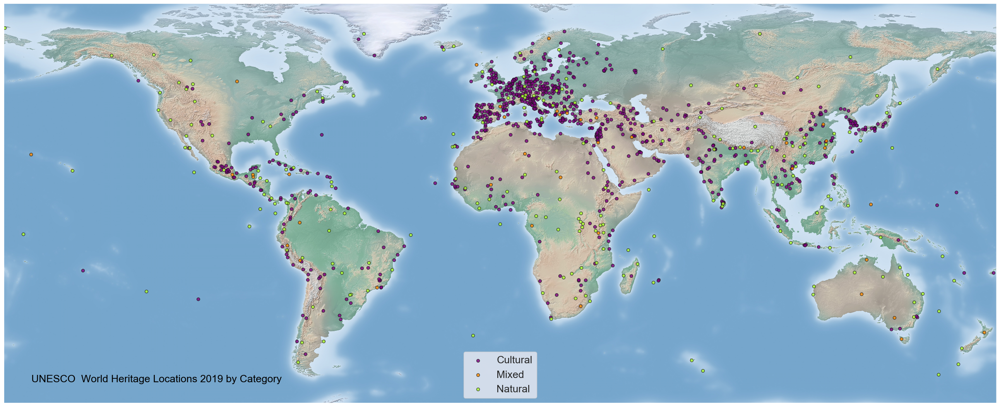

In [109]:
# Set the dimension of the figure
my_dpi=96
plt.figure(figsize=(2600/my_dpi, 1800/my_dpi), dpi=my_dpi)
 
# Make the background map
m=Basemap(llcrnrlon=-180, llcrnrlat=-65,urcrnrlon=180,urcrnrlat=80)
m.shadedrelief()


# Add a point per position
m.scatter(unesco_world_heritage_df_cultural['longitude'], 
          unesco_world_heritage_df_cultural['latitude'], 
          alpha=0.8, 
          c= "purple", 
          edgecolors='k',marker="o",
          label='Cultural'
         )

m.scatter(unesco_world_heritage_df_mixed['longitude'], 
          unesco_world_heritage_df_mixed['latitude'], 
          alpha=0.8, 
          c= "darkorange", 
          edgecolors='k',marker="o",
          label='Mixed'
         )

m.scatter(unesco_world_heritage_df_natural['longitude'], 
          unesco_world_heritage_df_natural['latitude'], 
          alpha=0.8, 
          c= "greenyellow", 
          edgecolors='k',marker="o",
          label='Natural'
         )


# copyright and source data info
plt.text( -170, -58,'UNESCO  World Heritage Locations 2019 by Category', ha='left', va='bottom', size=20, color='#000000')

plt.legend(loc='lower center', prop={'size': 20})
plt.tight_layout()    
    
# Save as png
plt.savefig('images/image5.png', bbox_inches='tight')
plt.show()